In [1]:
from igraph import *
import igraph as ig
import json
import random
import numpy as np
from numpy import linalg 
import itertools
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay  # needed for triangulation

import os
import pandas as pd
from copy import deepcopy
from tqdm.auto import tqdm

import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import networkx as nx
from matplotlib.collections import LineCollection

In [2]:
random.seed(2022)
np.random.seed(2022)

In [3]:
with open('los_angeles_censustracts.json') as f:
    census_tracts = json.loads(f.readline())

In [4]:
census_tracts['features'][0]['properties']

{'MOVEMENT_ID': '1', 'TRACT': '480302', 'DISPLAY_NAME': 'Census Tract 480302'}

In [5]:
np.array(census_tracts['features'][0]['geometry']['coordinates'][0]).mean(axis=0)  # [longitude, latitude]

array([-118.12053321,   34.10309557])

In [6]:
display_names = dict()
coordinates = dict()

for area in census_tracts['features']:
    id = int(area['properties']['MOVEMENT_ID'])
    display_name = area['properties']['DISPLAY_NAME']
    display_names[id] = display_name
    a = area['geometry']['coordinates'][0]
    coordinates[id] = np.array(a if type(a[0][0]) == float else a[0]).mean(axis=0)

In [7]:
for i in range(5):
    key = i + 1
    print('{}: {}, {}'.format(key, display_names[key], coordinates[key]))

1: Census Tract 480302, [-118.12053321   34.10309557]
2: Census Tract 480303, [-118.13785063   34.09645121]
3: Census Tract 480304, [-118.13138209   34.09626386]
4: Census Tract 480400, [-118.13224544   34.10349303]
5: Census Tract 480500, [-118.14492317   34.0986815 ]


In [8]:
g = Graph(directed=False)
g.add_vertices(len(display_names))
g.vs['display_name'] = list(display_names.values())  # index = id - 1
g.vs['coordinates'] = list(coordinates.values())

In [9]:
month_filter = {12}  # for monthly aggregate data of 4th quarter, we can filter data based off of only December

edges = []
weights = []

with open('los_angeles-censustracts-2019-4-All-MonthlyAggregate.csv') as f:
    f.readline()  # skip the first line
    
    while True:
        line = f.readline()
        if line == '':
            break  # end of file
        
        vals = line.strip().split(',')
        
        # read edge info
        src, dest, month, dist = int(vals[0]), int(vals[1]), int(vals[2]), float(vals[3])

        # if data is not relevant, skip it
        if month not in month_filter:
            continue
            
        edges.append((src - 1, dest - 1))
        weights.append(dist)

In [10]:
g.add_edges(edges)
g.es['weight'] = weights
del edges, weights

In [11]:
print(len(g.vs), len(g.es))

2716 1692450


In [12]:
# keep only the giant connected component
components = g.components()
gcc = max(components, key=len)
vs_to_delete = [i for i in range(len(g.vs)) if i not in gcc]
g.delete_vertices(vs_to_delete)

# remove duplicate edges
g = g.simplify(combine_edges=dict(weight='mean'))  # combine duplicate edges

In [13]:
print("number of vertices: " + str(len(g.vs)))
print("number of edges: " + str(len(g.es)))

number of vertices: 2649
number of edges: 1003858


In [14]:
mst = g.spanning_tree(weights=g.es['weight'])

In [15]:
edf = mst.get_edge_dataframe()
edf

,source,target,weight
edge ID,,,
0,0,2,129.765
1,0,13,118.335
2,1,2,90.235
3,1,3,126.475
4,1,9,125.675
...,...,...,...
2643,2628,2635,86.870
2644,2629,2635,91.775
2645,2630,2633,38.740


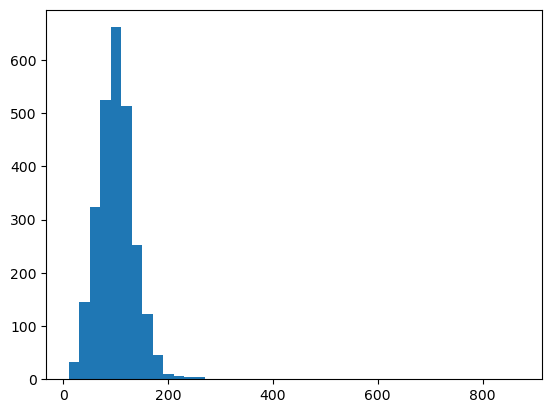

In [16]:
import matplotlib.pyplot as plt
weights = mst.es['weight']
binwidth = 20
bins = np.arange(min(weights), max(weights) + binwidth, binwidth)
plt.hist(weights, bins=bins)
plt.show()

In [17]:
for i, e in enumerate(mst.es):
    print('source vertice' + str(mst.vs[e.source]['coordinates']))
    print('target vertice' + str(mst.vs[e.target]['coordinates']))
    print('Distance in miles: {:.3f}\nTime taken: {:.1f}\n---------\n'.format(linalg.norm(mst.vs[e.source]['coordinates'] - mst.vs[e.target]['coordinates'])* 69, e['weight']))
    if i > 10:
        break

source vertice[-118.12053321   34.10309557]
target vertice[-118.13138209   34.09626386]
Distance in miles: 0.885
Time taken: 129.8
---------

source vertice[-118.12053321   34.10309557]
target vertice[-118.11656383   34.09585388]
Distance in miles: 0.570
Time taken: 118.3
---------

source vertice[-118.13785063   34.09645121]
target vertice[-118.13138209   34.09626386]
Distance in miles: 0.447
Time taken: 90.2
---------

source vertice[-118.13785063   34.09645121]
target vertice[-118.13224544   34.10349303]
Distance in miles: 0.621
Time taken: 126.5
---------

source vertice[-118.13785063   34.09645121]
target vertice[-118.14184446   34.08538654]
Distance in miles: 0.812
Time taken: 125.7
---------

source vertice[-118.13138209   34.09626386]
target vertice[-118.12911933   34.08759475]
Distance in miles: 0.618
Time taken: 119.9
---------

source vertice[-118.13224544   34.10349303]
target vertice[-118.14492317   34.0986815 ]
Distance in miles: 0.936
Time taken: 125.2
---------

source 

# TSP Approximation

### Check Traingle Inequality

In [18]:
def is_triangle(sides):
    # Create a new sorted list
    sorted_sides = sorted(sides)
    # Check the triangle inequality
    if sorted_sides[0] + sorted_sides[1] >= sorted_sides[2]:
        return True
    else:
        return False

print('Test:', is_triangle([1,4,2]), is_triangle([3,5,3]))

Test: False True


In [19]:
def sample_triangles(g, n_samples):
    #result = list()
    #result will have tuple of the the vertices of a triangle
    triangles = g.cliques(min=3, max=3)
    return random.sample(triangles, n_samples)

In [20]:
######################################################
#n_samples = 1000  # WARNING: this might take a minute for larger sample sizes
#triangles = 0
#sampled = sample_triangles(g, n_samples)

#for triangle_vs in sampled:

#    edge_lengths = []
    
#    for i in range(3):
#        for j in range(i):
#            edge_lengths.append(min(g.es.select(_between=([triangle_vs[i]], [triangle_vs[j]]))['weight']))   
            
#    triangles += is_triangle(edge_lengths)

#print('Triangle inequality holds by {}%'.format(round(100.0 * triangles / n_samples, 1)))

In [21]:
def preorder_traversal(root, parent=None):
    result = []
    if root is not None:
        result.append(root)  # Visit root
        children = root.neighbors()
        for child in children:
            if child != parent:
                result.extend(preorder_traversal(child, root))  # Visit child subtrees
    return result

### Preorder Traversal Demo

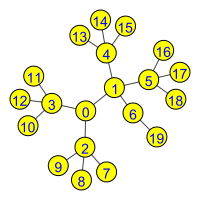

In [22]:
t = Graph.Tree(20, 3)

visual_style = {}
visual_style["vertex_color"] = 'yellow'
visual_style["vertex_label"] = [v.index for v in t.vs]
visual_style["vertex_label_color"] = 'blue'
visual_style["bbox"] = (200, 200)

plot(t, **visual_style)

In [23]:
print([v.index for v in preorder_traversal(t.vs[0])])

[0, 1, 4, 13, 14, 15, 5, 16, 17, 18, 6, 19, 2, 7, 8, 9, 3, 10, 11, 12]


### Actual Data

In [24]:
# Helper function to get unique vertices in a path
def unique_path(path):
    visited = set()
    unique = []
    for vertex in path:
        if vertex not in visited:
            unique.append(vertex)
            visited.add(vertex)
    return unique

# Find the Eulerian cycle using Hierholzer's algorithm
def get_eulerian_circuit(graph):
    search_stack = [0]  # Start from node 0
    eulerian_circuit = []

    while search_stack:
        v = search_stack[-1]
        if graph.degree(v) > 0:
            # Remove one edge
            for w in graph.neighbors(v):
                graph.delete_edges(graph.get_eid(v, w))
                search_stack.append(w)
                break
        else:
            # If no more edges, we can add this node to the circuit
            eulerian_circuit.append(search_stack.pop())
    return eulerian_circuit[::-1]  # Reverse to get the correct order

In [25]:
# Traveling salesman problem 1-approximation
# MST
# mst in this case
# Two copies of MST
eulerian_graph = ig.Graph(directed=False)
eulerian_graph.add_vertices(mst.vcount())
for edge in mst.es:
    source, target = g.vs[edge.source].index, g.vs[edge.target].index
    eulerian_graph.add_edge(source, target)
    eulerian_graph.add_edge(source, target)
# Euler Walk
eulerian_path = get_eulerian_circuit(eulerian_graph)

# Make the path unique
tsp = unique_path(eulerian_path)

# Add the start of the path to the end, to make the salesman return to the start
tsp.append(tsp[0])

print('TSP path:', tsp)
print('IDs:\n' + '-' * 10 + '\n' + '\n'.join([mst.vs[i]['display_name'] for i in tsp]))

TSP path: [0, 2, 1, 3, 4, 8, 5, 1664, 1663, 1171, 1177, 1178, 1175, 1172, 1170, 1173, 1161, 1162, 1164, 1163, 1168, 1179, 2000, 1996, 1999, 1998, 1995, 1035, 1036, 1034, 1037, 1038, 1039, 1032, 1046, 1045, 1997, 1798, 1834, 1835, 1048, 1047, 1050, 1049, 1044, 1043, 1060, 1051, 1166, 1160, 1056, 1055, 1052, 1053, 1054, 1065, 1167, 1169, 1675, 1153, 1206, 1215, 1159, 1158, 1157, 1146, 1145, 1147, 1152, 1130, 1111, 1110, 1108, 1109, 1141, 1140, 1138, 1139, 1071, 1066, 1073, 1070, 1674, 1069, 1068, 1067, 1063, 1061, 1057, 369, 1030, 1029, 349, 346, 505, 509, 504, 2244, 2136, 2135, 2138, 2137, 341, 340, 689, 688, 687, 685, 686, 695, 696, 1684, 690, 1679, 342, 343, 348, 347, 365, 363, 361, 354, 353, 351, 352, 350, 355, 345, 344, 356, 357, 358, 359, 360, 141, 130, 142, 129, 128, 126, 124, 693, 846, 691, 692, 833, 834, 845, 841, 840, 836, 831, 807, 808, 720, 719, 718, 810, 756, 710, 712, 714, 713, 715, 708, 754, 751, 742, 741, 1910, 1908, 744, 743, 727, 1909, 1907, 753, 740, 737, 738, 747, 745

In [26]:
# Initialize the list of hop distances
hop_distances = []

# Calculate the distance for each 'hop' in the TSP path
for i in range(len(tsp)-1):
    source, target = tsp[i], tsp[i+1]
    shortest_path_distance = g.distances(source, target,weights = "weight")[0][0]
    hop_distances.append(shortest_path_distance)

# Print the hop distances
print('Hop distances:\n' + '-' * 10 + '\n' +
      '\n'.join(['{:.3f}'.format(x) for x in hop_distances]))

Hop distances:
----------
129.765
90.235
126.475
125.160
91.785
60.910
87.115
43.330
68.810
130.045
117.430
97.520
88.940
121.045
219.300
122.560
101.975
185.285
116.045
96.300
525.110
439.475
127.635
243.310
115.820
91.310
58.075
63.395
114.085
104.440
109.100
77.220
87.820
338.060
100.195
362.570
140.670
78.305
175.055
380.025
68.525
82.645
108.085
110.405
84.215
98.150
157.270
71.385
92.435
82.635
91.390
84.445
212.860
146.690
179.660
447.370
121.495
334.215
84.635
152.495
83.080
73.635
61.540
60.360
45.455
53.030
67.820
52.470
44.020
94.160
78.885
70.305
101.305
97.930
112.880
133.095
135.995
115.225
129.880
101.210
115.790
143.455
235.365
79.545
57.410
78.845
61.860
55.235
60.085
44.215
91.140
120.360
156.935
154.350
140.325
135.730
235.970
131.585
109.775
374.350
99.745
130.065
179.295
190.030
157.105
131.875
129.210
114.380
138.635
128.245
288.015
593.620
129.410
373.715
127.630
470.780
129.195
241.015
103.385
87.600
128.645
113.630
110.490
99.990
146.310
291.630
134.685
142.590

### Measureing Relative Performance Guarantee

In [27]:
mst_cost = sum(mst.es['weight'])
mst_cost

269084.5449999994

<hr><b><font color="red">WARNING: SLOW!</font></b>

In [28]:
tsp_cost = np.sum(hop_distances)
tsp_cost

422811.08499999996

In [29]:
print('MST Cost:', round(mst_cost))
print('TSP Cost:', round(tsp_cost))
print('Ratio:', round(tsp_cost/mst_cost, 2))

MST Cost: 269085
TSP Cost: 422811
Ratio: 1.57


---
TSP results should resemble the following figure

In [30]:
all_coordinates = np.array(g.vs['coordinates'])
tsp_coordinates = all_coordinates[tsp, :]
tsp_coordinates = np.vstack([tsp_coordinates, tsp_coordinates[0, :]])  # connect the last element back to the first element

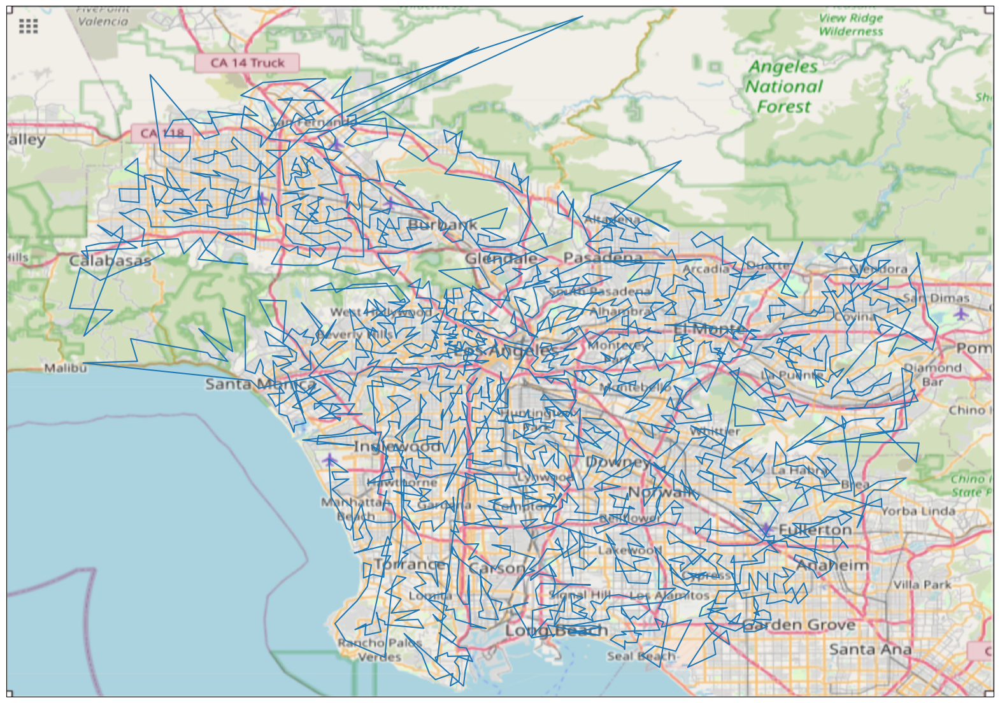

In [31]:
# Create a figure and axes with a desired projection
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Plot the TSP path
ax.plot(tsp_coordinates[:, 0], tsp_coordinates[:, 1], '-')
Bounding = ((-118.75,   -117.75, 33.7, 34.4))
ruh_m = plt.imread('LA_OSM_Map.png')
ax.imshow(ruh_m, zorder=0, extent = Bounding, aspect= 'equal')

# Set the extent of the plot to match the TSP coordinates
ax.set_xlim(Bounding[0],Bounding[1])
ax.set_ylim(Bounding[2],Bounding[3])
# Show the plot
plt.show()

### Triangulation

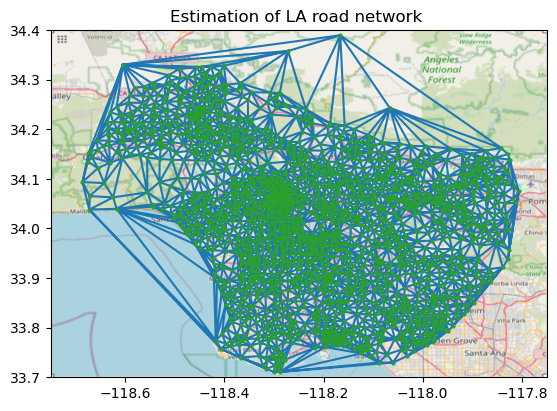

In [32]:
points = np.array(g.vs['coordinates'])
tri = Delaunay(points)
#use the Delaunay function imported above
plt.triplot(points[:,0], points[:,1], tri.simplices)
plt.plot(points[:,0], points[:,1], 'o',markersize=2)
plt.title('Estimation of LA road network ')
ruh_m = plt.imread('LA_OSM_Map.png')
plt.imshow(ruh_m, zorder=0, extent = Bounding, aspect= 'equal')
plt.show()

In [33]:
# Create an edge lookup dictionary
edge_dict = {(min(e.tuple[0], e.tuple[1]), max(e.tuple[0], e.tuple[1])): e.index for e in g.es}

# Prepare a list to collect edge indices
edges_to_induce = []

# Iterate over the simplices to find corresponding edges in the original graph
for i in range(tri.simplices.shape[0]):
    for col1, col2 in ((0, 1), (1, 2), (0, 2)):
        v1 = tri.simplices[i, col1]
        v2 = tri.simplices[i, col2]
        
        # Ensure vertices are in order (smaller, larger)
        v_small, v_large = min(v1, v2), max(v1, v2)

        # Check if the corresponding edge exists in the original graph
        if (v_small, v_large) in edge_dict:
            edges_to_induce.append(edge_dict[(v_small, v_large)])

# Create a subgraph based on these edges
tri_g = g.subgraph_edges(edges_to_induce, delete_vertices=False)

### Estimate Traffic Flows

In [34]:
edge_ends = tri_g.get_edgelist()
sources, targets = [item[0] for item in edge_ends],[item[1] for item in edge_ends]

In [35]:
edge_ends = tri_g.get_edgelist()
edge_ends
array1 = tri_g.vs[sources]['coordinates']
array2 = tri_g.vs[targets]['coordinates']
result = [a1 - a2 for a1, a2 in zip(array1, array2)]
distance = [69 * np.sqrt(np.sum(np.square(d))) for d in result]

In [36]:
array1 = [np.array([-118.13138209, 34.09626386]), np.array([-118.13224544, 34.10349303])]
array2 = [np.array([-118.13138209, 34.09626386]), np.array([-118.13224544, 34.10349303])]
result = [a1 - a2 for a1, a2 in zip(array1, array2)]
result

[array([0., 0.]), array([0., 0.])]

In [37]:
# Graph: tri_g
edge_ends = tri_g.get_edgelist()
edge_ends
array1 = tri_g.vs[sources]['coordinates']
array2 = tri_g.vs[targets]['coordinates']
result = [a1 - a2 for a1, a2 in zip(array1, array2)]
distance = [69 * np.sqrt(np.sum(np.square(d))) for d in result]
travel_time = tri_g.es['weight']
speeds =  np.array(distance) / np.array(travel_time) * 3600
car_length = 0.003
safety_distances = speeds * (2/3600)
n_lanes = 2
cars_per_mile = distance/(safety_distances+car_length)*n_lanes
cars_per_hour = cars_per_mile * np.array(speeds)

In [38]:
tri_g.es['capacity'] = cars_per_hour

In [39]:
cars_per_hour

array([2610.30838923, 2320.93506639, 1564.10824046, ..., 1723.36439509,
       2680.91204853, 1450.17172086])

# Max Flow Analysis

In [40]:
source_coordinates = [-118.56, 34.04]  # malibu
dest_coordinates = [-118.18, 33.77]  # long beach
min_malibu=np.inf
min_long_beach=np.inf
long_beach_node=0
malibu_node=0
for i in range(1,len(points[:,0])):
    long_beach_closest=np.sqrt(((points[i][0])-dest_coordinates[0])**2+((points[i][1])-dest_coordinates[1])**2)
    malibu_closest=np.sqrt((source_coordinates[0]-points[i][0])**2+(source_coordinates[1]-points[i][1])**2)
    if long_beach_closest<min_long_beach:
        min_long_beach=long_beach_closest
        long_beach_node=i
    if malibu_closest<min_malibu:
        min_malibu=malibu_closest
        malibu_node=i
long_beach_node

660

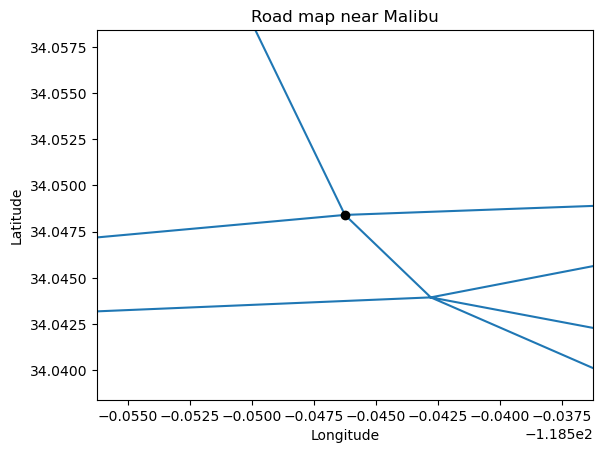

In [41]:
plt.triplot(points[:,0], points[:,1], tri.simplices)
plt.ylim(points[malibu_node][1]-0.01,points[malibu_node][1]+0.01)
plt.xlim(points[malibu_node][0]-0.01,points[malibu_node][0]+0.01)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Road map near Malibu')
plt.plot(points[malibu_node][0], points[malibu_node][1],'o',color='black')
plt.show()

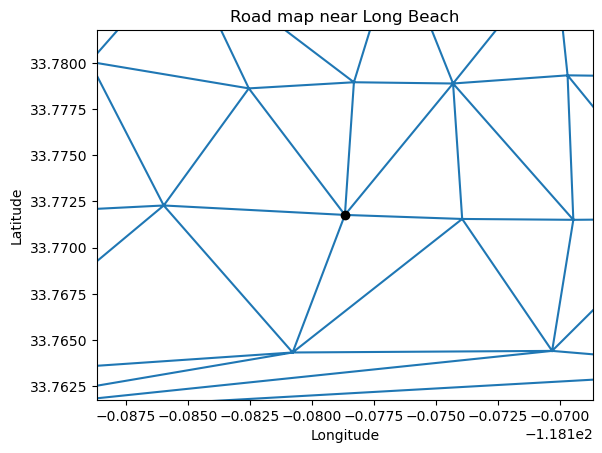

In [42]:
plt.triplot(points[:,0], points[:,1], tri.simplices)
plt.ylim(points[long_beach_node][1]-0.01,points[long_beach_node][1]+0.01)
plt.xlim(points[long_beach_node][0]-0.01,points[long_beach_node][0]+0.01)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Road map near Long Beach')
plt.plot(points[long_beach_node][0], points[long_beach_node][1],'o',color='black')
plt.show()

### Calculate Max Flow

In [43]:
print('Number of independent roads:',tri_g.edge_disjoint_paths(malibu_node,long_beach_node) ) #max flow of graph (inbuilt is okay )
print('Number of cars per hour:',tri_g.maxflow(malibu_node, long_beach_node, 'capacity').value )

Number of independent roads: 4
Number of cars per hour: 7579.860651821042


In [44]:
maxflow = tri_g.maxflow(malibu_node, long_beach_node, 'capacity')
maxflow.value

7579.860651821042

### Trimming Large-Distance (Non-Local) Roads

In [45]:
trim_thresh = 800

In [46]:
edges_to_induce = tri_g.es.select(weight_le=trim_thresh)
tri_g_trimmed = tri_g.subgraph_edges(edges_to_induce)

### Visualizing Trimming Scheme

<hr><b><font color="red">WARNING: SLOW!</font></b>

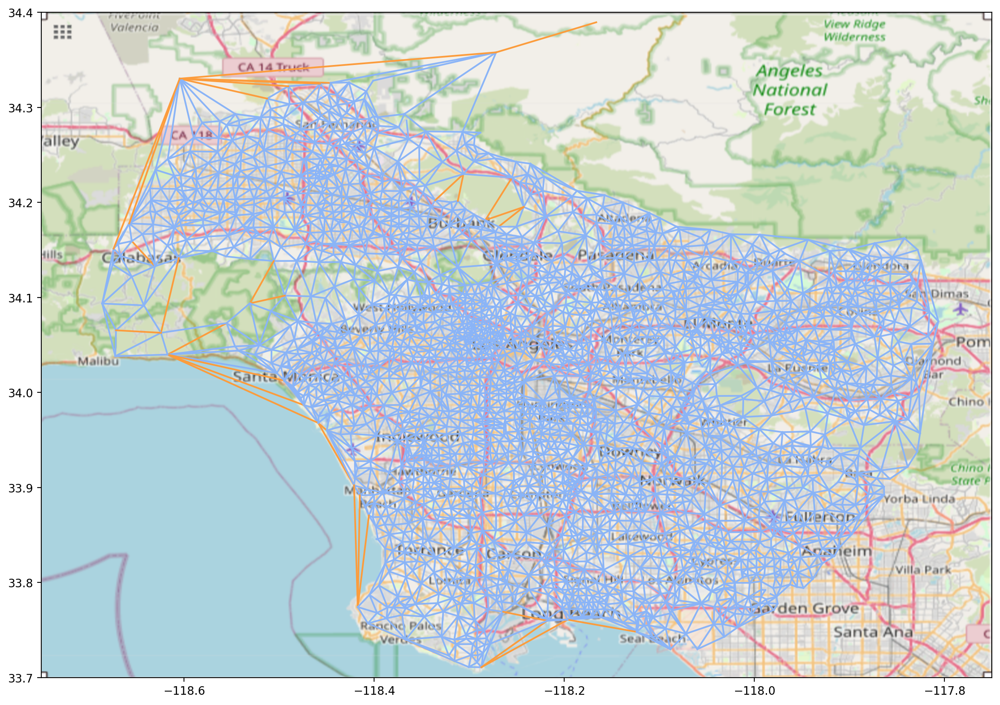

In [47]:
# plot the roads
plt.figure(figsize=(15,15), dpi=200)
for e in tri_g.es:
    v1 = tri_g.vs[e.source]['coordinates']
    v2 = tri_g.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    plt.plot(x, y, '#8ab4f7' if e['weight'] < trim_thresh else '#fc9c3c')

# mark the source and destination
# source = tri_g.vs.select(display_name=source_address)[0].index
# target = tri_g.vs.select(display_name=dest_address)[0].index
# v1 = tri_g.vs[source_idx]['coordinates']
# v2 = tri_g.vs[dest_idx]['coordinates']
# data = np.vstack([v1, v2])
# x = data[:, 0]
# y = data[:, 1]
# plt.plot(x, y, 'bo')

ruh_m = plt.imread('LA_OSM_Map.png')
plt.imshow(ruh_m, zorder=0, extent = Bounding, aspect= 'equal')
plt.show()

In [48]:
mst = tri_g_trimmed.spanning_tree(weights=tri_g_trimmed.es['weight'])
eulerian_graph1 = ig.Graph(directed=False)
eulerian_graph1.add_vertices(mst.vcount())
for edge in mst.es:
    source, target = tri_g_trimmed.vs[edge.source].index, tri_g_trimmed.vs[edge.target].index
    eulerian_graph1.add_edge(source, target)
    eulerian_graph1.add_edge(source, target)

# Euler Walk
eulerian_path1 = get_eulerian_circuit(eulerian_graph1)

# Make the path unique
tsp = unique_path(eulerian_path1)
len(tsp)

2647

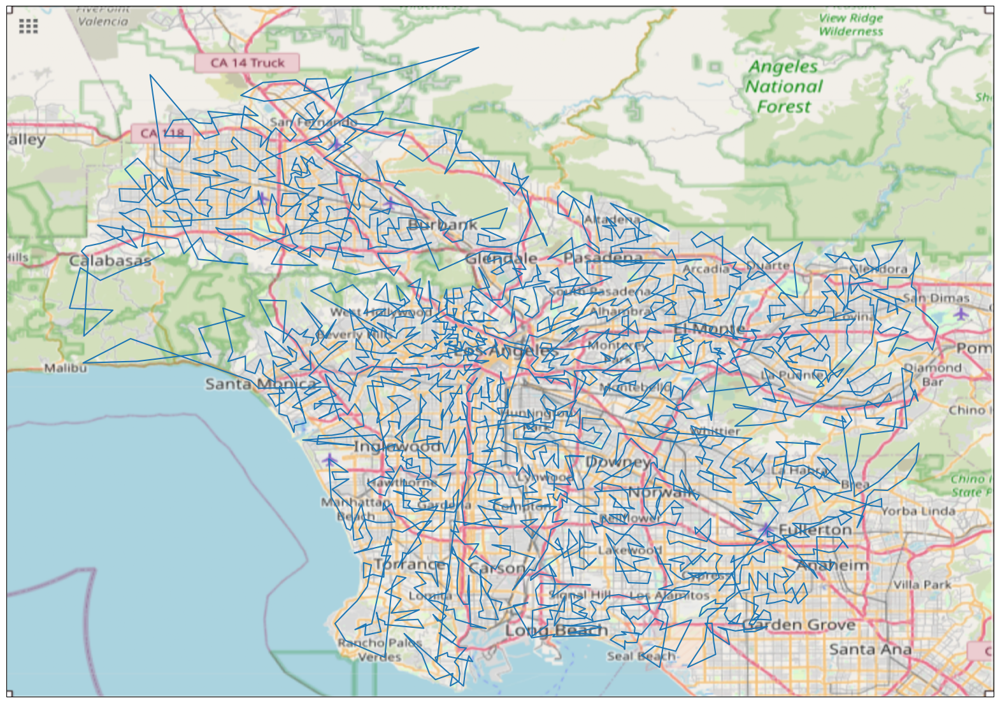

In [49]:
all_coordinates = np.array(tri_g_trimmed.vs['coordinates'])
tsp_coordinates = all_coordinates[tsp, :]
tsp_coordinates = np.vstack([tsp_coordinates, tsp_coordinates[0, :]])  # connect the last element back to the first element

# Create a figure and axes with a desired projection
fig = plt.figure(figsize=(20, 20))
ax = plt.axes(projection=ccrs.PlateCarree())

# Plot the TSP path
ax.plot(tsp_coordinates[:, 0], tsp_coordinates[:, 1], '-')
Bounding = ((-118.75,   -117.75, 33.7, 34.4))
ruh_m = plt.imread('LA_OSM_Map.png')
ax.imshow(ruh_m, zorder=0, extent = Bounding, aspect= 'equal')

# Set the extent of the plot to match the TSP coordinates
ax.set_xlim(Bounding[0],Bounding[1])
ax.set_ylim(Bounding[2],Bounding[3])
# Show the plot
plt.show()

### Aside: Let's Get A Bit of Intuition about Data

In [57]:
def get_sorted_extra_distances(G):
    
    # add weights to network G
    G_nx = G.to_networkx()
    attrs = {}

    nx.set_edge_attributes(G_nx, attrs)
    
    # calculate extra distances for all pairs
    n_node = len(G_nx)
    extra_distances = []
    inf = 1e6  # if there is no path, set to a large value

    for i in tqdm(range(n_node-1)):
        for j in range(i+1, n_node):
            extra_distance = (
                dist_matrix[i][j]
                - compute_single_edge_distance(i, j)
            )
            extra_distances.append((extra_distance, i, j))
    
    return sorted(extra_distances, reverse=True)


def compute_single_edge_distance(s, t):
    x1, x2 = longitudes[s], longitudes[t]
    y1, y2 = latitudes[s], latitudes[t] 
    return ((x1 - x2) ** 2 + (y1 - y2) ** 2) ** 0.5


def print_coordinates(arr):
    for i, (_, s, t) in enumerate(arr):
        x1, x2 = longitudes[s], longitudes[t]
        y1, y2 = latitudes[s], latitudes[t]
        print(f"\nedge {i+1}: ({y1}, {x1}) - ({y2}, {x2})")

In [58]:
def plot_graph_with_new_roads(new_edges):
    new_edges_array = np.array([[s, t] for _, s, t in new_edges])
    lc_new = LineCollection(points[new_edges_array], colors="red")
    fig, ax = plt.subplots(figsize=(8, 7))
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    ruh_m = plt.imread("LA_OSM_Map.png")
    plt.imshow(ruh_m, zorder=0, extent = Bounding, aspect= 'equal')   
    plt.gca().add_collection(lc_new)
    plt.show()

In [59]:
new_g = tri_g_trimmed.copy()
for e in new_g.es:
    # Get the source and target vertices of the edge
    source_vertex = e.source
    target_vertex = e.target
    
    # Get the coordinates of the source and target vertices
    source_coordinates = tri_g_trimmed.vs[source_vertex]['coordinates']
    target_coordinates = tri_g_trimmed.vs[target_vertex]['coordinates']

    # Calculate the geodesic distance between the two vertices
    distance = ((source_coordinates[0] - target_coordinates[0]) ** 2 + (source_coordinates[1] - target_coordinates[1]) ** 2) ** 0.5
    
    # Update the weight of the edge
    e['weight'] = distance

In [60]:
# Q19
k = 20
dist_matrix = new_g.shortest_paths(weights='weight')
points = np.array(new_g.vs['coordinates'])
latitudes = points[:,0]
longitudes = points[:,1]
extra_distances = get_sorted_extra_distances(new_g)
extra_distances_topk = extra_distances[:k]
print("Top 20 pairs with highest extra distance: (distance, v, s)")
print(extra_distances_topk)
print_coordinates(extra_distances_topk)

C:\Users\15123\AppData\Local\Temp\ipykernel_23320\621683075.py:3: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  dist_matrix = new_g.shortest_paths(weights='weight')


  0%|          | 0/2646 [00:00<?, ?it/s]

Top 20 pairs with highest extra distance: (distance, v, s)
[(0.11661860410860841, 1783, 2416), (0.11617165060871026, 2140, 2419), (0.11414825603644496, 1860, 2416), (0.11337999394573656, 382, 2419), (0.11038819549635265, 383, 2419), (0.10889014837969668, 1699, 1783), (0.10872873756879575, 391, 2419), (0.10811511286294317, 1901, 2419), (0.10795094696637342, 381, 2419), (0.1066007559055549, 1699, 1860), (0.10657572718707192, 2163, 2419), (0.10605333016714441, 386, 2419), (0.10600807595529399, 390, 2419), (0.10550259008670515, 1904, 2419), (0.10534695919001047, 45, 2419), (0.10533990016218936, 1783, 2413), (0.10533894891149931, 1906, 2419), (0.1053347425776226, 2158, 2419), (0.10528633069215532, 1902, 2419), (0.10512508811330096, 392, 2419)]

edge 1: (-118.41714115454548, 33.774103109090916) - (-118.67145511923503, 34.06533878290219)

edge 2: (-117.84197423684212, 34.16224818421053) - (-118.27158981797648, 34.35782482248528)

edge 3: (-118.40648371022725, 33.75689578693178) - (-118.671455

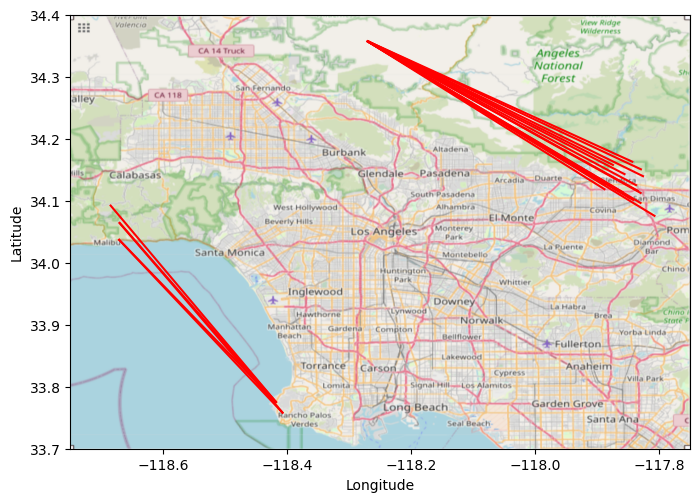

In [61]:
plot_graph_with_new_roads(extra_distances_topk)

In [62]:
tri_g_trimmed.vs[0]

igraph.Vertex(<igraph.Graph object at 0x000001FFD9DAC340>, 0, {'display_name': 'Census Tract 480302', 'coordinates': array([-118.12053321,   34.10309557])})

  0%|          | 0/3501981 [00:00<?, ?it/s]

Top 20 pairs with highest weighted extra distance: (distance, v, s)
[(103.98124128532093, 2161, 2419), (101.53301909129863, 43, 2419), (98.02366296487271, 2160, 2419), (96.80105885791512, 221, 2419), (96.46255758380741, 2060, 2419), (96.24526105974026, 2142, 2419), (95.91584726055349, 1902, 2419), (95.69542269740609, 2081, 2419), (95.62898984857308, 219, 2419), (95.50046121773036, 2052, 2419), (95.16990597076531, 2176, 2419), (94.43330172386798, 385, 2419), (94.18532618546296, 2151, 2419), (93.26020412511413, 234, 2419), (92.98644668882119, 389, 2419), (92.90524295346313, 2158, 2419), (91.65441779534508, 259, 2419), (90.86597665044513, 2069, 2419), (90.15682397510147, 253, 2419), (89.55460225699632, 1678, 2411)]

edge 1: (-117.89487851190476, 34.117642214285716) - (-118.27158981797648, 34.35782482248528)

edge 2: (-117.90064863057323, 34.15035921019108) - (-118.27158981797648, 34.35782482248528)

edge 3: (-117.88409822784814, 34.11270067088606) - (-118.27158981797648, 34.35782482248528

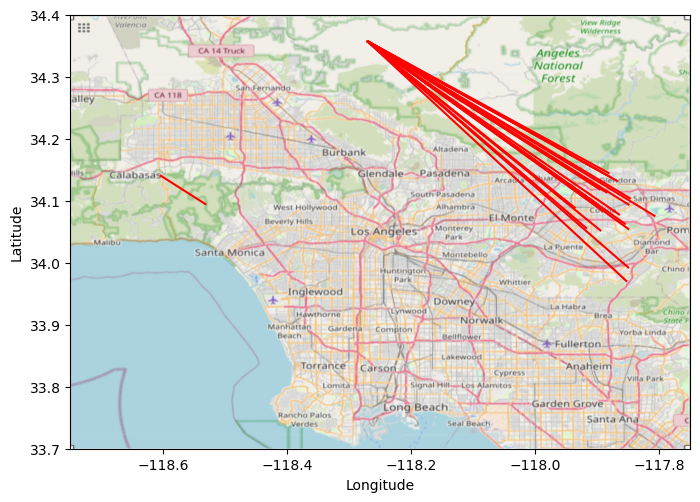

In [63]:
# Q20
weighted_extra_distances = [
    (extra_distance*random.randint(1, 1000), i, j)
    for extra_distance, i, j in tqdm(extra_distances)
]
weighted_extra_distances_topk = sorted(weighted_extra_distances, reverse=True)[:k]
print("Top 20 pairs with highest weighted extra distance: (distance, v, s)")
print(weighted_extra_distances_topk)
print_coordinates(weighted_extra_distances_topk)
plot_graph_with_new_roads(weighted_extra_distances_topk)

In [64]:
tri_g_trimmed.vs[0]

igraph.Vertex(<igraph.Graph object at 0x000001FFD9DAC340>, 0, {'display_name': 'Census Tract 480302', 'coordinates': array([-118.12053321,   34.10309557])})

In [65]:
dist_matrix[5][9]

0.01720459284956895

In [66]:
g_time = tri_g_trimmed.copy()
for e in g_time.es:
    # Get the source and target vertices of the edge
    source_vertex = e.source
    target_vertex = e.target
    
    # Get the coordinates of the source and target vertices
    source_coordinates = tri_g_trimmed.vs[source_vertex]['coordinates']
    target_coordinates = tri_g_trimmed.vs[target_vertex]['coordinates']

    # Calculate the geodesource_vertexsic distance between the two vertices
    distance = ((source_coordinates[0] - target_coordinates[0]) ** 2 + (source_coordinates[1] - target_coordinates[1]) ** 2) ** 0.5
    time = e['weight']
    distance_st = dist_matrix[source_vertex][target_vertex]
    speed = distance_st/time
    time_direct = distance/speed
    time_extra = time - time_direct
    # Update the weight of the edge
    e['distance'] = distance
    e['distance_st'] = distance_st
    e['speed'] = speed
    e['time_extra'] = time_extra

In [67]:
def get_sorted_extra_distances(G):
    
    # add weights to network G
    G_nx = G.to_networkx()
    attrs = {}

    nx.set_edge_attributes(G_nx, attrs)
    
    # calculate extra distances for all pairs
    n_node = len(G_nx)
    extra_times = []
    inf = 1e6  # if there is no path, set to a large value

    for i in tqdm(range(n_node-1)):
        for j in range(i+1, n_node):
            extra_time = (
                time_matrix[i][j]-
                compute_single_edge_distance(i, j)/(dist_matrix[i][j]/time_matrix[i][j])
                
            )
            extra_times.append((extra_time, i, j))
    
    return sorted(extra_times, reverse=True)

In [68]:
# Q22
time_matrix = g_time.distances(weights='weight')
# travel time matrix and travel distance matrix
k = 20
extra_times = get_sorted_extra_distances(g_time)
extra_times_topk = extra_times[:k]
print("Top 20 pairs with highest extra time: (time, v, s)")
print(extra_times_topk)
print_coordinates(extra_times_topk)

  0%|          | 0/2646 [00:00<?, ?it/s]

Top 20 pairs with highest extra time: (time, v, s)
[(1270.3895410723735, 1783, 2416), (1252.8631429260095, 1860, 2416), (1153.8889769479183, 1783, 2413), (1146.2778771962248, 1859, 2416), (1134.1965992778387, 1860, 2413), (1132.3580394431988, 1699, 1783), (1119.6690284556112, 1699, 1860), (1107.7052218590086, 985, 1678), (1104.5835299882676, 988, 1510), (1094.0169192124886, 1782, 2416), (1075.812196539635, 989, 1510), (1071.6095362416345, 144, 1783), (1053.8289562498721, 144, 1860), (1051.7197552248826, 430, 1783), (1044.4861781848101, 950, 1510), (1043.687810050943, 989, 1678), (1041.616826813589, 1882, 2416), (1034.078921859059, 430, 1860), (1032.7277657916725, 951, 1510), (1030.2237008168743, 984, 1678)]

edge 1: (-118.41714115454548, 33.774103109090916) - (-118.67145511923503, 34.06533878290219)

edge 2: (-118.40648371022725, 33.75689578693178) - (-118.67145511923503, 34.06533878290219)

edge 3: (-118.41714115454548, 33.774103109090916) - (-118.68599468727271, 34.09347549818183)

e

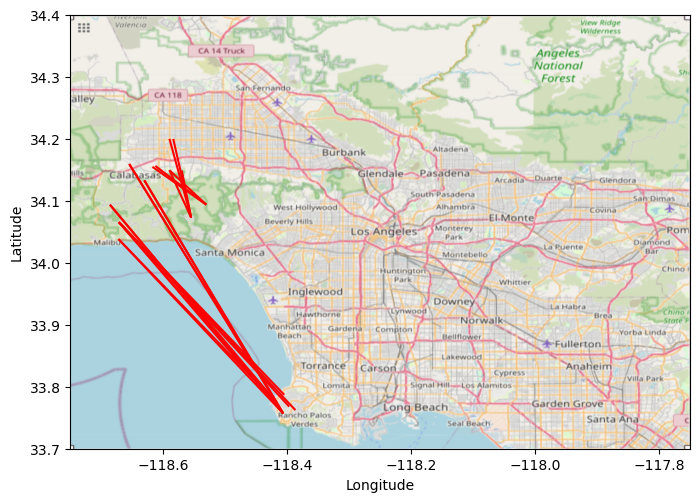

In [69]:
plot_graph_with_new_roads(extra_times_topk)

In [70]:
def add_1_edge(G, index):
    source = index[0][1]
    target = index[0][2]
    weight = time_matrix[source][target] - index[0][0]
    distance = compute_single_edge_distance(source, target)

    edge = G.add_edge(source, target)
    G.es[edge.index]['weight'] = weight
    G.es[edge.index]['distance'] = distance

In [71]:
# Q23
# add_edge 20 times
g1 = g_time.copy()
added_edge = []
time_matrix = g1.distances(weights='weight')
dist_matrix = g1.shortest_paths(weights='distance')
for i in range(20):
    extra_times = get_sorted_extra_distances(g1)
    added_edge.append(extra_times[0])
    add_1_edge(g1,extra_times)
    time_matrix = g1.distances(weights='weight')
    dist_matrix = g1.shortest_paths(weights='distance')

C:\Users\15123\AppData\Local\Temp\ipykernel_23320\1893036783.py:6: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  dist_matrix = g1.shortest_paths(weights='distance')


  0%|          | 0/2646 [00:00<?, ?it/s]

C:\Users\15123\AppData\Local\Temp\ipykernel_23320\1893036783.py:12: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  dist_matrix = g1.shortest_paths(weights='distance')


  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

In [72]:
len(g1.es)

7776

In [73]:
print("Top 20 pairs with highest extra time (dynamic): (time, v, s)")
print(added_edge)
print_coordinates(added_edge)

Top 20 pairs with highest extra time (dynamic): (time, v, s)
[(1270.3895410723735, 1783, 2416), (1107.7052218590086, 985, 1678), (1104.5835299882676, 988, 1510), (978.0953184724199, 2140, 2419), (968.0607081219923, 1783, 2417), (906.8975174051993, 2081, 2419), (897.5132840438332, 49, 2419), (854.5711392642315, 285, 2419), (834.3139270021093, 2262, 2419), (793.4149992916323, 2273, 2419), (790.3522519838634, 1717, 2419), (772.4319041228841, 2402, 2416), (739.9104313030123, 1003, 1678), (732.3491204243983, 1964, 2419), (724.8957281211938, 1956, 2419), (707.650688529332, 1700, 1782), (699.1161963754884, 120, 687), (678.5899314331853, 2247, 2419), (668.9713721662154, 121, 1679), (656.8276261852361, 144, 1875)]

edge 1: (-118.41714115454548, 33.774103109090916) - (-118.67145511923503, 34.06533878290219)

edge 2: (-118.6174550722892, 34.15459418072292) - (-118.53067983104125, 34.09368131827117)

edge 3: (-118.57017334070797, 34.14872431415929) - (-118.55510068503939, 34.07289098425196)

edge 

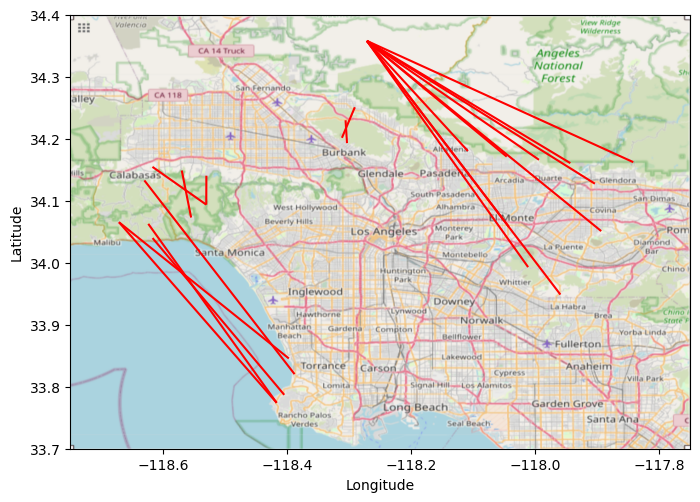

In [74]:
plot_graph_with_new_roads(added_edge)

In [75]:
# Q24
def get_sorted_extra_distances(G):
    
    # add weights to network G
    G_nx = G.to_networkx()
    attrs = {}

    nx.set_edge_attributes(G_nx, attrs)
    
    # calculate extra distances for all pairs
    n_node = len(G_nx)
    extra_times = []
    inf = 1e6  # if there is no path, set to a large value

    for i in tqdm(range(n_node-1)):
        for j in range(i+1, n_node):
            extra_time = (
                time_matrix[i][j]-
                compute_single_edge_distance(i, j)/(dist_matrix[i][j]/time_matrix[i][j])
                
            )
            extra_time_weighted = extra_time * weight_matrix[i][j]
            extra_times.append((extra_time_weighted, i, j))
    
    return sorted(extra_times, reverse=True)
def add_1_edge(G, index):
    source = index[0][1]
    target = index[0][2]
    weight = time_matrix[source][target] - index[0][0]/weight_matrix[source][target]
    distance = compute_single_edge_distance(source, target)

    edge = G.add_edge(source, target)
    G.es[edge.index]['weight'] = weight
    G.es[edge.index]['distance'] = distance

n_nodes = len(g1.vs)
weight_matrix = [
    [random.randint(1,1000) for _ in range(n_nodes)]
    for _ in range(n_nodes)
    ]

# add_edge 20 times
g1 = g_time.copy()
added_edge = []    
time_matrix = g1.distances(weights='weight')
dist_matrix = g1.shortest_paths(weights='distance')
for i in range(20):
    weighted_extra_times = get_sorted_extra_distances(g1)
    added_edge.append(weighted_extra_times[0])
    add_1_edge(g1,weighted_extra_times)
    time_matrix = g1.distances(weights='weight')
    dist_matrix = g1.shortest_paths(weights='distance')


C:\Users\15123\AppData\Local\Temp\ipykernel_23320\2822066448.py:46: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  dist_matrix = g1.shortest_paths(weights='distance')


  0%|          | 0/2646 [00:00<?, ?it/s]

C:\Users\15123\AppData\Local\Temp\ipykernel_23320\2822066448.py:52: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  dist_matrix = g1.shortest_paths(weights='distance')


  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

In [76]:
print("Top 20 pairs with highest weighted extra time (dynamic): (time, v, s)")
print(added_edge)
print_coordinates(added_edge)

Top 20 pairs with highest weighted extra time (dynamic): (time, v, s)
[(1014718.1403566865, 987, 1510), (956123.1029802257, 1783, 2415), (955995.7495816515, 1859, 2416), (935908.7285159945, 383, 2419), (852900.5168150081, 2419, 2462), (848314.7167245926, 2079, 2419), (837372.5125255233, 1783, 2417), (810719.9011159596, 988, 1678), (764394.2363749143, 286, 2419), (703964.4187339406, 299, 2419), (675969.4998477531, 1799, 2419), (644080.1587683879, 1699, 1858), (627520.251889558, 2025, 2416), (611045.8936931874, 1003, 1700), (609071.4662387567, 427, 2416), (601809.2941042549, 120, 689), (579310.3656274902, 144, 2043), (575648.9056634746, 1003, 1511), (574048.6241724751, 144, 426), (563329.0003085762, 680, 2419)]

edge 1: (-118.59730984444444, 34.16049380000001) - (-118.55510068503939, 34.07289098425196)

edge 2: (-118.41714115454548, 33.774103109090916) - (-118.67397635416673, 34.15129022916667)

edge 3: (-118.39683944230771, 33.7679271025641) - (-118.67145511923503, 34.06533878290219)

e

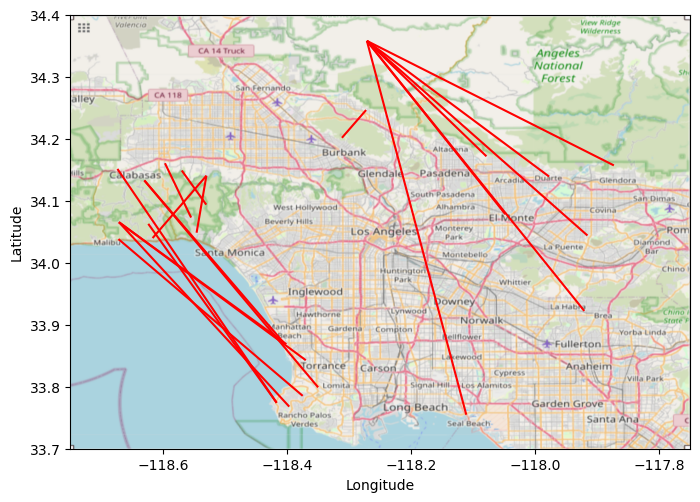

In [77]:
plot_graph_with_new_roads(added_edge)

In [78]:
# Q21
def get_sorted_extra_distances(G):
    
    # add weights to network G
    G_nx = G.to_networkx()
    attrs = {}

    nx.set_edge_attributes(G_nx, attrs)
    
    # calculate extra distances for all pairs
    n_node = len(G_nx)
    extra_distances = []
    inf = 1e6  # if there is no path, set to a large value

    for i in tqdm(range(n_node-1)):
        for j in range(i+1, n_node):
            extra_distance = (
                dist_matrix[i][j]
                - compute_single_edge_distance(i, j)
            )
            extra_distances.append((extra_distance, i, j))

    return sorted(extra_distances, reverse=True)

def add_1_edge(G, index):
    source = index[0][1]
    target = index[0][2]
    weight = time_matrix[source][target] - index[0][0]/weight_matrix[source][target]
    distance = compute_single_edge_distance(source, target)

    edge = G.add_edge(source, target)
    G.es[edge.index]['distance'] = distance

# add_edge 20 times
g1 = g_time.copy()
added_edge = []
dist_matrix = g1.shortest_paths(weights='distance')
for i in range(20):
    extra_distances = get_sorted_extra_distances(g1)
    n_nodes = len(g1.vs)
    added_edge.append(extra_distances[0])
    add_1_edge(g1,extra_distances)
    dist_matrix = g1.shortest_paths(weights='distance')

C:\Users\15123\AppData\Local\Temp\ipykernel_23320\1467949845.py:37: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  dist_matrix = g1.shortest_paths(weights='distance')


  0%|          | 0/2646 [00:00<?, ?it/s]

C:\Users\15123\AppData\Local\Temp\ipykernel_23320\1467949845.py:43: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  dist_matrix = g1.shortest_paths(weights='distance')


  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

  0%|          | 0/2646 [00:00<?, ?it/s]

In [79]:
print("Top 20 pairs with highest extra distance (dynamic): (distance, v, s)")
print(added_edge)
print_coordinates(added_edge)

Top 20 pairs with highest extra distance (dynamic): (distance, v, s)
[(0.11661860410860841, 1783, 2416), (0.11617165060871026, 2140, 2419), (0.10463929764174847, 986, 1510), (0.10350492324700983, 49, 2419), (0.1014667965126414, 285, 2419), (0.09603143370735362, 1717, 2419), (0.08975133249591655, 1783, 2417), (0.08808444169976332, 1956, 2419), (0.08073637034270212, 2247, 2419), (0.07875472008634088, 1005, 1678), (0.0775242820048263, 2414, 2619), (0.0740019810227257, 121, 689), (0.07361292518078288, 2242, 2419), (0.07341356533715154, 1699, 1781), (0.07252775265557754, 144, 2619), (0.07039598202487579, 2402, 2416), (0.06839124523119561, 144, 2040), (0.06673515270823566, 1700, 1782), (0.06612849598931886, 356, 1679), (0.06489104989670524, 2414, 2559)]

edge 1: (-118.41714115454548, 33.774103109090916) - (-118.67145511923503, 34.06533878290219)

edge 2: (-117.84197423684212, 34.16224818421053) - (-118.27158981797648, 34.35782482248528)

edge 3: (-118.57609893103452, 34.163914112068966) - (-

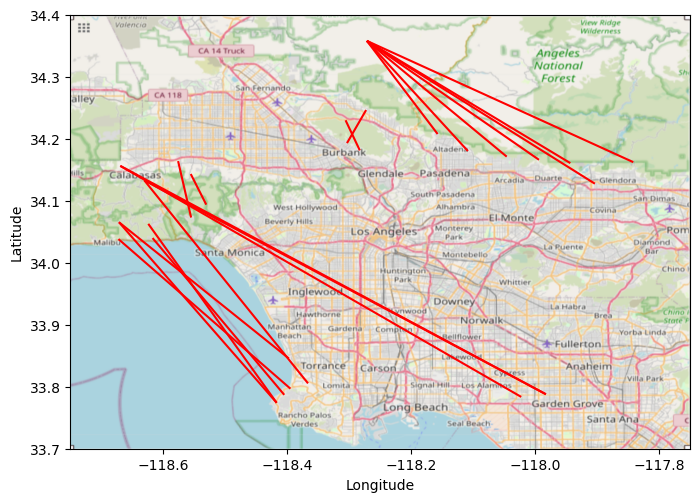

In [80]:
plot_graph_with_new_roads(added_edge)